In [2]:
#imports
%matplotlib inline

from PIL import Image
import urllib, cStringIO
import random

from astropy.io import fits as pyfits
from astropy.table import Table,join
import numpy as np
import os
from astropy.io.fits import Column
from datetime import datetime
from operator import itemgetter
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
plt.rcParams['text.usetex']=True

#function for getting galaxy images
def get_image_from_url(url):

    file = cStringIO.StringIO(urllib.urlopen(url).read())
    img = Image.open(file)
    return img

#table of galaxies - vote fractions and urls for getting images. 
data=Table.read('gzh_3_23_with_urls.fits')

#current threshold values:
cuts=Table.read('gzh_cuts.fits')
p_features_cut=cuts['p_features_cut'][0]
p_clumpy_no_cut=cuts['p_clumpy_no_cut'][0]


# Task 09: Does the galaxy have a bulge at the center? If so, what shape?



Task 01: Is the galaxy smooth or featured? (answer featured) 

Task 12: Does the galaxy have a mostly clumpy appearance? (answer no) 

T02: Could this be a disk viewed edge-on? (answer yes)

In [4]:
# Task 3:  Bar

#First define the task in question:
p_rounded = 't09_bulge_shape_a01_rounded_weighted_fraction' # vote fraction for task
p_boxy = 't09_bulge_shape_a02_boxy_weighted_fraction' # vote fraction for task
p_no_bulge = 't09_bulge_shape_a03_no_bulge_weighted_fraction' # vote fraction for task
N_bulge_shape = 't09_bulge_shape_total_weight' # number of votes for task

#and the previous tasks:
p_features = 't01_smooth_or_features_a02_features_or_disk_best_fraction' # vote fraction for previous task
p_clumpy_no = 't12_clumpy_a02_no_weighted_fraction' # vote fraction for previous task
p_edgeon_yes = 't02_edgeon_a01_yes_weighted_fraction' # vote fraction for previous task

#how many minimum votes to be confident in vote fraction: 
N_cut = 20
min_N = (data[N_bulge_shape]>=N_cut)

featured = (data[p_features]>p_features_cut)
not_clumpy = (data[p_clumpy_no]>p_clumpy_no_cut)


# calculate average p_task in bins of p_prev_task, with width of dp = 0.1
p_prev_task_list = np.linspace(.05,.95,10)

fraction_list_rounded=[]
err_list_rounded=[]
fraction_list_boxy=[]
err_list_boxy=[]
fraction_list_no_bulge=[]
err_list_no_bulge=[]



for p in p_prev_task_list:
    task_data = (data[p_edgeon_yes]>p-.05) & (data[p_edgeon_yes]<p+.05) & min_N & featured & not_clumpy

    #compute the average p_task in this bin
    N_in_bin = len(data[task_data])
    fraction_list_rounded.append(np.nanmean(data[task_data][p_rounded]))
    fraction_list_boxy.append(np.nanmean(data[task_data][p_boxy]))
    fraction_list_no_bulge.append(np.nanmean(data[task_data][p_no_bulge]))



    try:
        err_list_rounded.append(np.nanstd(data[task_data][p_rounded])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_rounded.append(0)
    try:
        err_list_boxy.append(np.nanstd(data[task_data][p_boxy])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_boxy.append(0)
    try:
        err_list_no_bulge.append(np.nanstd(data[task_data][p_no_bulge])/np.sqrt(N_in_bin))
    except TypeError:
        err_list_no_bulge.append(0)


y1_rounded = [f+e for f,e in zip(fraction_list_rounded,err_list_rounded)]
y2_rounded = [f-e for f,e in zip(fraction_list_rounded,err_list_rounded)]

y1_boxy = [f+e for f,e in zip(fraction_list_boxy,err_list_boxy)]
y2_boxy = [f-e for f,e in zip(fraction_list_boxy,err_list_boxy)]


y1_no_bulge = [f+e for f,e in zip(fraction_list_no_bulge,err_list_no_bulge)]
y2_no_bulge = [f-e for f,e in zip(fraction_list_no_bulge,err_list_no_bulge)]




/usr/local/lib/python2.7/dist-packages/numpy/lib/nanfunctions.py:675: RuntimeWarning: Mean of empty slice
  warnings.warn("Mean of empty slice", RuntimeWarning)
/usr/local/lib/python2.7/dist-packages/numpy/lib/nanfunctions.py:1136: RuntimeWarning: Degrees of freedom <= 0 for slice.
  warnings.warn("Degrees of freedom <= 0 for slice.", RuntimeWarning)


(0, 1)

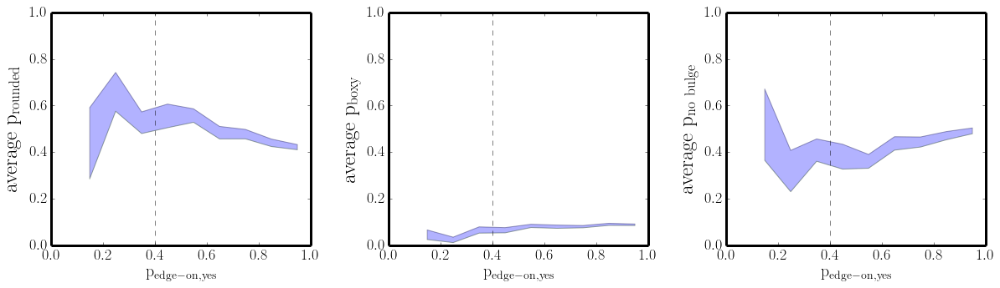

In [16]:
plt.rcParams['axes.linewidth'] = 3
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18 

p_edgeon_yes_cut = 0.4

f=plt.figure(figsize=(20,5))
gs=gridspec.GridSpec(1,3)
gs.update(wspace=.3)

plt.subplot(gs[0,0])
plt.plot(p_prev_task_list,y1_rounded,alpha=.1)
plt.plot(p_prev_task_list,y2_rounded,alpha=.1)
plt.fill_between(p_prev_task_list,y1_rounded,y2_rounded,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{rounded}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{edge-on,yes}}$',fontsize=20)
plt.axvline(x=p_edgeon_yes_cut,ls='dashed',color='k',alpha=.5)
plt.xlim(0,1)
plt.ylim(0,1)

plt.subplot(gs[0,1])
plt.plot(p_prev_task_list,y1_boxy,alpha=.1)
plt.plot(p_prev_task_list,y2_boxy,alpha=.1)
plt.fill_between(p_prev_task_list,y1_boxy,y2_boxy,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{boxy}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{edge-on,yes}}$',fontsize=20)
plt.axvline(x=p_edgeon_yes_cut,ls='dashed',color='k',alpha=.5)
plt.xlim(0,1)
plt.ylim(0,1)

plt.subplot(gs[0,2])
plt.plot(p_prev_task_list,y1_no_bulge,alpha=.1)
plt.plot(p_prev_task_list,y2_no_bulge,alpha=.1)
plt.fill_between(p_prev_task_list,y1_no_bulge,y2_no_bulge,alpha=.3)

plt.ylabel(r'$\mathrm{average~p_{no~bulge}}$',fontsize=25)
plt.xlabel(r'$\mathrm{p_{edge-on,yes}}$',fontsize=20)
plt.axvline(x=p_edgeon_yes_cut,ls='dashed',color='k',alpha=.5)
plt.xlim(0,1)
plt.ylim(0,1)

## Below: Visually inspect galaxies for "bulge shape candidates" - galaxies for which asking the bulge shape question makes physical sense. These should be edge-on disks.

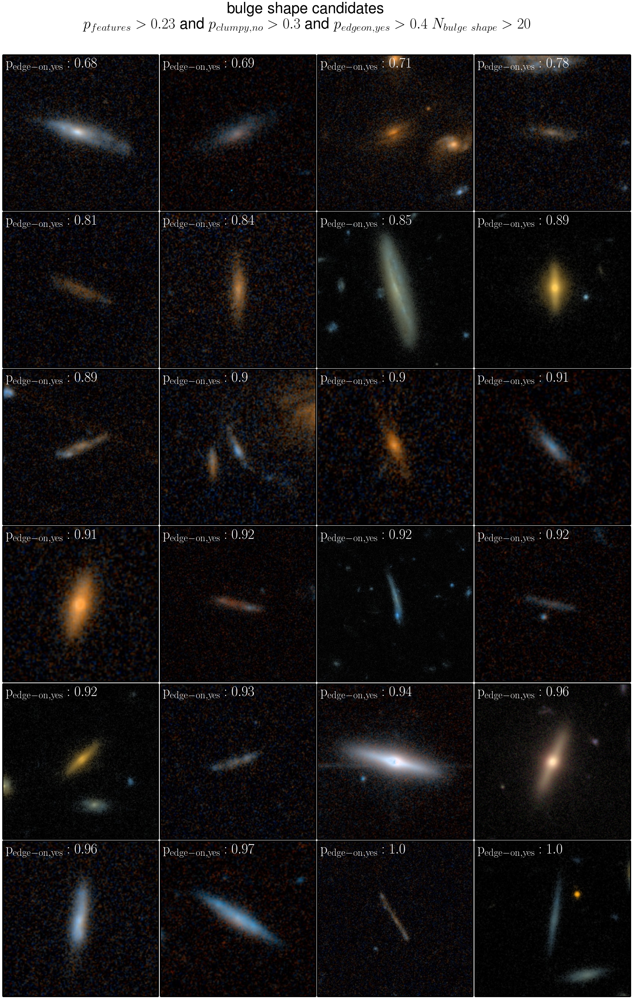

In [17]:
edgeon =(data[p_edgeon_yes]>p_edgeon_yes_cut)

gs=gridspec.GridSpec(6,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria= featured & not_clumpy & edgeon & min_N
these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.shuffle(n_list)

#how many galaxies to display?
n_gals = 24
random_n_list = n_list[0:n_gals]

random_gal_list = []
for n in random_n_list:
    random_gal_list.append(these_data[int(n)])

#now we have a random list of galaxies - sort them by p_edgeon_yes, column 22
random_gal_list.sort(key=itemgetter(22))

f=plt.figure(figsize=(30,45))
n=0
for i in range (0,6):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        gal = random_gal_list[n] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{edge-on,yes}: %s}$'%round(gal[p_edgeon_yes],2),fontsize=38,xy=(0.02,.97),
            xycoords='axes fraction',verticalalignment='top',color='white')

        #ax.annotate('$\mathrm{p_{bar}: %s}$\n$\mathrm{p_{spiral}: %s}$'%(round(gal[p_bar_yes],2),round(gal[p_spiral],2)),fontsize=38,xy=(0.02,.02),
           # xycoords='axes fraction',color='white')

        n+=1
        

f.text(.5,.92,'bulge shape candidates\n$p_{features} > %s$~and~$p_{clumpy,no}>%s$ and $p_{edgeon,yes}>%s$ $N_{bulge~shape}>20$'%(p_features_cut,p_clumpy_no_cut,p_edgeon_yes_cut), fontsize=40,ha='center')





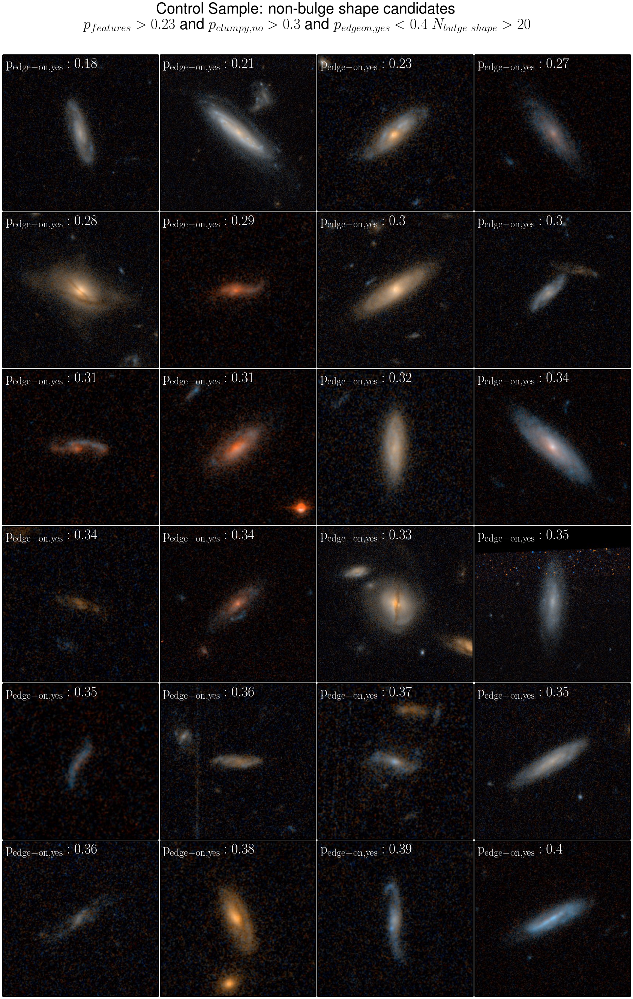

In [24]:
not_edgeon =(data[p_edgeon_yes]<p_edgeon_yes_cut)

gs=gridspec.GridSpec(6,4)
gs.update(wspace=0.01)
gs.update(hspace=0.01)
 
data_criteria= featured & not_clumpy & not_edgeon & min_N
these_data=data[data_criteria]

if len(these_data) < 20:
    print 'try new values'

#shuffle which galaxies get displayed     
n_list=np.linspace(0,len(these_data)-1,len(these_data))
random.shuffle(n_list)

#how many galaxies to display?
n_gals = 24
random_n_list = n_list[0:n_gals]

random_gal_list = []
for n in random_n_list:
    random_gal_list.append(these_data[int(n)])

#now we have a random list of galaxies - sort them by p_edgeon_yes, column 22
random_gal_list.sort(key=itemgetter(22))

f=plt.figure(figsize=(30,45))
n=0
for i in range (0,6):
    for j in range(0,4):
        ax=plt.subplot(gs[i,j])
        gal = random_gal_list[n] # random galaxy from big list 
        plt.imshow(get_image_from_url(gal['location']))
        plt.tick_params(labelbottom='off',labelleft='off')
        ax.annotate('$\mathrm{p_{edge-on,yes}: %s}$'%round(gal[p_edgeon_yes],2),fontsize=38,xy=(0.02,.97),
            xycoords='axes fraction',verticalalignment='top',color='white')

        #ax.annotate('$\mathrm{p_{bar}: %s}$\n$\mathrm{p_{spiral}: %s}$'%(round(gal[p_bar_yes],2),round(gal[p_spiral],2)),fontsize=38,xy=(0.02,.02),
           # xycoords='axes fraction',color='white')

        n+=1
        

f.text(.5,.92,'Control Sample: non-bulge shape candidates\n$p_{features} > %s$~and~$p_{clumpy,no}>%s$ and $p_{edgeon,yes}<%s$ $N_{bulge~shape}>20$'%(p_features_cut,p_clumpy_no_cut,p_edgeon_yes_cut), fontsize=40,ha='center')





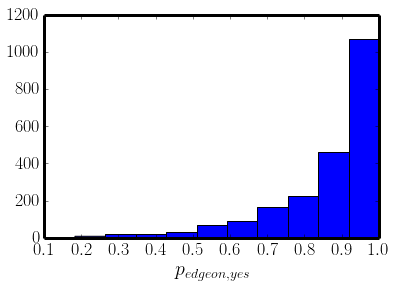

In [15]:
plt.hist(data[featured & not_clumpy & min_N][p_edgeon_yes])
plt.xlabel('$p_{edgeon,yes}$',fontsize=20)

## Featured, non-clumpy galaxies which have at least 20 answers to the bulge shape question are rarely not-edge-on; a cut of p_edgeon_yes>0.4 is sufficient. 

In [25]:
cuts['p_edgeon_yes_cut']=p_edgeon_yes_cut

newtable = cuts.copy(copy_data=True)
fname = 'gzh_cuts.fits'
if os.path.exists(fname):
    os.remove(fname)
newtable.write(fname,format='fits')